In [1]:
import warnings
import numpy as np
#from sklearn.preprocessing import normalize
import glob
import cv2
import matplotlib.pyplot as plt

warnings.filterwarnings('ignore')

In [2]:
path = 'Assignment1_data/data/data/*'
files = glob.glob(path)
FilterBank = np.load('FilterBank.npy')
fileP = []
features = []
for i in range(len(files)):
    fileP.append(files[i])
    img = cv2.imread(files[i], cv2.IMREAD_GRAYSCALE)
    img = cv2.resize(img,(32,32))
    fea = np.array([])
    for j in range(48):
        if(not j):
            fea = cv2.filter2D(img,-1,FilterBank[:,:,j])
        else:
            fea = np.concatenate((fea,cv2.filter2D(img,-1,FilterBank[:,:,j])))
    fea = np.reshape(fea,(1,-1))
    if(not i):
        features = fea
    else:
        features = np.concatenate((features,fea))
    #print(features.shape)
np.save('features.npy',features)
np.save('filePath.npy',fileP)
print('done')

    
    


done


Assignment1_data/query/data/0000.jpg
Assignment1_data/query/data/0001.jpg
Assignment1_data/query/data/0002.jpg
Assignment1_data/query/data/0003.jpg
Assignment1_data/query/data/0004.jpg
done


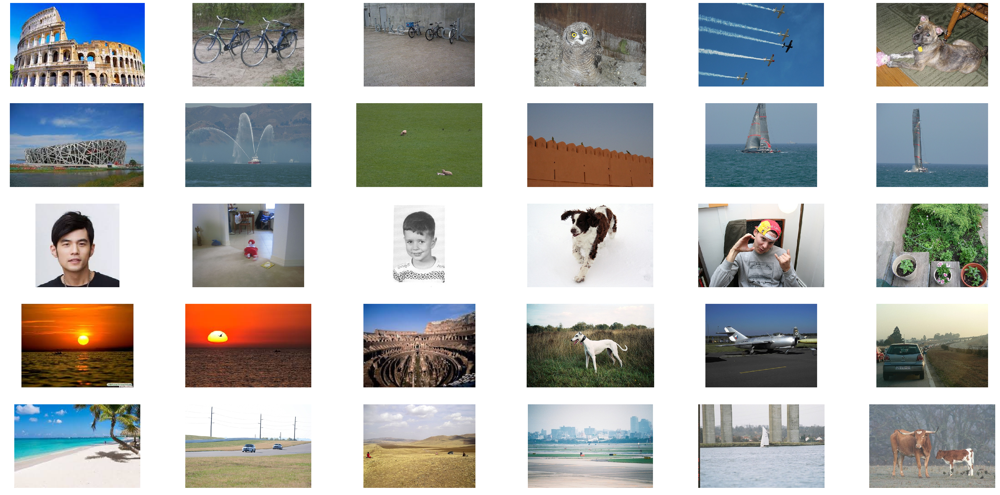

In [3]:
plt.rcParams['figure.figsize'] = [60,30]
from sklearn.metrics.pairwise import cosine_similarity
def normalize(x):
    minv = np.min(x)
    maxv = np.max(x)
    return (1.0*(x-minv)/(maxv-minv))
features = np.load('features.npy')
fileP = np.load('filePath.npy')
FilterBank = np.load('FilterBank.npy')
features = normalize(features)
path = 'Assignment1_data/query/data/*'
files = glob.glob(path)
for i in range(len(files)):
    print(files[i])
    img = cv2.imread(files[i], cv2.IMREAD_GRAYSCALE)
    img = cv2.resize(img,(32,32))
    fea = np.array([])
    for j in range(48):
        if(not j):
            fea = cv2.filter2D(img,-1,FilterBank[:,:,j])
        else:
            fea = np.concatenate((fea,cv2.filter2D(img,-1,FilterBank[:,:,j])))
    fea = np.reshape(fea,(1,-1))
    fea = normalize(fea)
    sim = cosine_similarity(fea,features)
    plt.subplot(len(files),6,6*i+1)
    img = cv2.imread(files[i])
    plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    plt.axis('off')
            
    for k in range(5):
        idx = np.argmax(sim)
        img = cv2.imread(fileP[idx])
        plt.subplot(len(files),6,6*i+1+k+1)
        plt.axis('off')
        plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
        sim[0,idx] = 0
        
        
print('done')


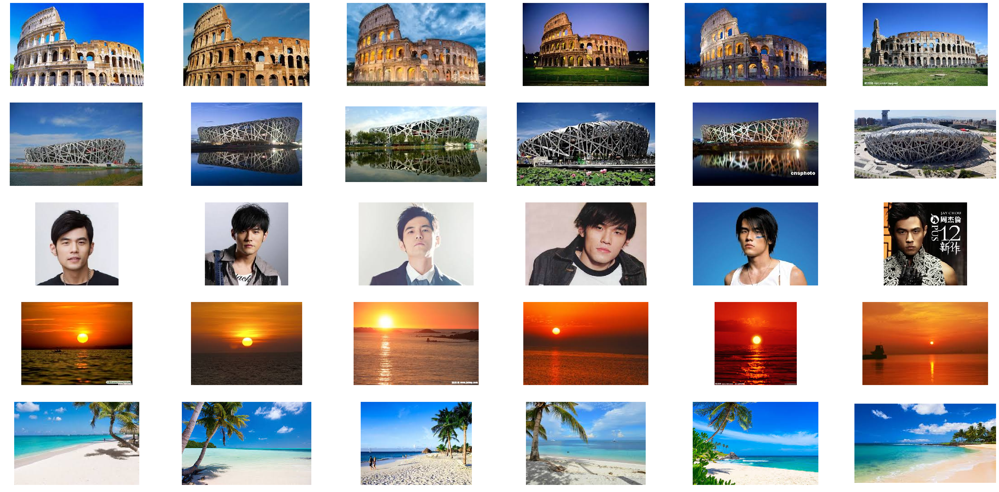

In [4]:
Res50features = np.load('Res50Features.npy')
QRes50features = np.load('QueryRes50Features.npy')
sims = cosine_similarity(QRes50features,Res50features)
for i in range(len(files)):
    sim = sims[i]
    plt.subplot(len(files),6,6*i+1)
    img = cv2.imread(files[i])
    plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    plt.axis('off')
            
    for k in range(5):
        idx = np.argmax(sim)
        img = cv2.imread(fileP[idx])
        plt.subplot(len(files),6,6*i+1+k+1)
        plt.axis('off')
        plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
        sim[idx] = 0


done


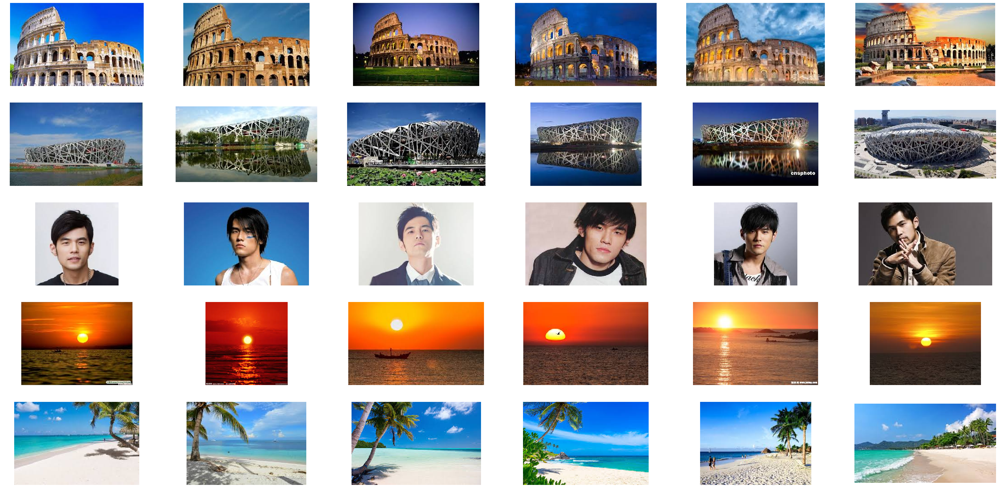

In [5]:
Res101features = np.load('Res101Features.npy')
QRes101features = np.load('QueryRes101Features.npy')     
sims = cosine_similarity(QRes101features,Res101features)
for i in range(len(files)):
    sim = sims[i]
    plt.subplot(len(files),6,6*i+1)
    img = cv2.imread(files[i])
    plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    plt.axis('off')
            
    for k in range(5):
        idx = np.argmax(sim)
        img = cv2.imread(fileP[idx])
        plt.subplot(len(files),6,6*i+1+k+1)
        plt.axis('off')
        plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
        sim[idx] = 0       
print('done')

Assignment1_data/query/data/0000.jpg
Assignment1_data/query/data/0001.jpg
Assignment1_data/query/data/0002.jpg
Assignment1_data/query/data/0003.jpg
Assignment1_data/query/data/0004.jpg
done


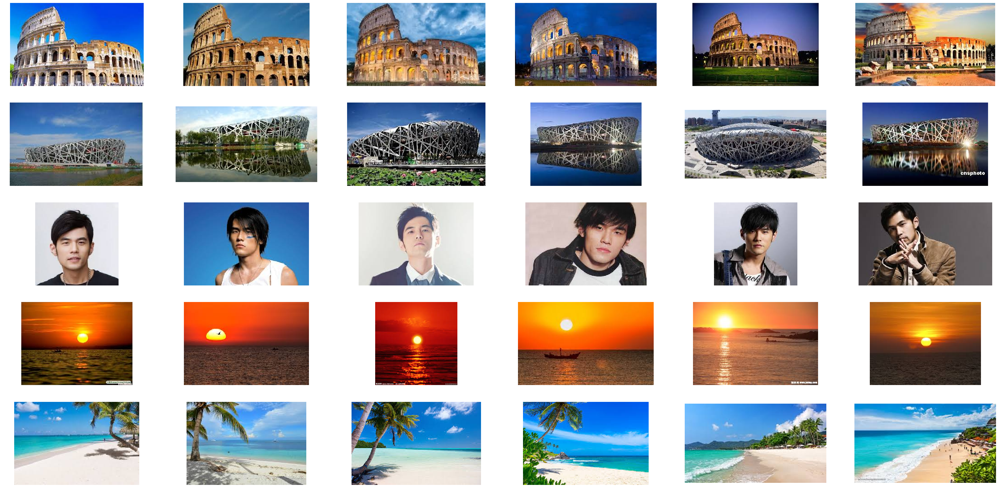

In [6]:
#fuse filter bank and ResNet101 features
Res101features = np.load('Res101Features.npy')
QRes101features = np.load('QueryRes101Features.npy')     
sims = cosine_similarity(QRes101features,Res101features)
for i in range(len(files)):
    print(files[i])
    img = cv2.imread(files[i], cv2.IMREAD_GRAYSCALE)
    img = cv2.resize(img,(32,32))
    fea = np.array([])
    for j in range(48):
        if(not j):
            fea = cv2.filter2D(img,-1,FilterBank[:,:,j])
        else:
            fea = np.concatenate((fea,cv2.filter2D(img,-1,FilterBank[:,:,j])))
    fea = np.reshape(fea,(1,-1))
    fea = normalize(fea)
    sim = cosine_similarity(fea,features)
    sim = (sim + sims[i])/2
    plt.subplot(len(files),6,6*i+1)
    img = cv2.imread(files[i])
    plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    plt.axis('off')
            
    for k in range(5):
        idx = np.argmax(sim)
        img = cv2.imread(fileP[idx])
        plt.subplot(len(files),6,6*i+1+k+1)
        plt.axis('off')
        plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
        sim[0,idx] = 0
        
        
print('done')


In [7]:
#competition
#fuse filter bank and ResNet101 features     
sims = cosine_similarity(QRes101features,Res101features)
with open('rankList.txt', 'w') as f:
    for i in range(len(files)):
        print(files[i])
        img = cv2.imread(files[i], cv2.IMREAD_GRAYSCALE)
        img = cv2.resize(img,(32,32))
        fea = np.array([])
        for j in range(48):
            if(not j):
                fea = cv2.filter2D(img,-1,FilterBank[:,:,j])
            else:
                fea = np.concatenate((fea,cv2.filter2D(img,-1,FilterBank[:,:,j])))
        fea = np.reshape(fea,(1,-1))
        fea = normalize(fea)
        sim = cosine_similarity(fea,features)
        sim = (sim + sims[i])/2
        sorting = np.argsort(sim[0,:])[::-1].tolist()
        f.write('Q'+str(i+1)+': ')
        for idx in sorting:
            f.write(str(idx)+' ')
        f.write('\n')
        #print(sorting)
        
print('done')


Assignment1_data/query/data/0000.jpg
Assignment1_data/query/data/0001.jpg
Assignment1_data/query/data/0002.jpg
Assignment1_data/query/data/0003.jpg
Assignment1_data/query/data/0004.jpg
done
